In [1]:

import os 
import numpy as np
import torch
import torch.nn as nn 
import random
import matplotlib.pyplot as plt 
import skimage 
from skimage.transform import resize
from skimage.metrics import peak_signal_noise_ratio
from tqdm import tqdm
import wandb
from deepinv.physics import Tomography, Downsampling

from torch.func import jvp, functional_call, jacrev

from operator_module import OperatorModule

from model.unet import get_unet_model



In [2]:
cfg = {
    "forward_operator": "radon",  #"downsampling", # "radon"
    "lr": 1e-4,
    "num_angles": 90,
    "rel_noise": 0.05,
    "num_epochs": 10000,
    "img_log_freq": 100,
    "model_params": {
        "use_norm": False,
        "scales": 5,
        "use_sigmoid": False,
        "skip": 16,
        "channels": (32, 64, 128, 128, 256, 256),
        "activation" : "relu" # "silu"
    },
    "model_inp": "fbp", # "random" "fbp"
    "inp_noise": 0.05,
    "optimiser": "adam", # "lbfgs" "adam" "gd" #amsgrad # "rmsprop"
    "betas": (0.9, 0.999),
    "momentum" : 0.0,
    "weight_decay": 0.0,
    "tv_reg": 4e-4
    ,
    "tv_type": "anisotropic"
}

In [3]:

#device = "cuda:1"
device = "cpu"
# If I set torch.manuel_seed it is still random 
torch.manual_seed(1)

#model = get_unet_model(use_norm=cfg["model_params"]["use_norm"], 
#                        scales=cfg["model_params"]["scales"],
#                        use_sigmoid=cfg["model_params"]["use_sigmoid"], 
#                        skip=cfg["model_params"]["skip"],
#                        channels=cfg["model_params"]["channels"])


class SimpleCNN(nn.Module):
    def __init__(self, input_channels):
        super(SimpleCNN, self).__init__()
        
        # Convolutional layers with padding to maintain input shape
        self.conv1 = nn.Conv2d(input_channels, 16, kernel_size=3, stride=1, padding=1)  # 3x3 kernel, stride=1, padding=1
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1)
        
        # Final layer to restore the input channel count
        self.conv4 = nn.Conv2d(16, input_channels, kernel_size=3, stride=1, padding=1)
        
        # Activation function
        self.relu = nn.ReLU()
        
    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.relu(self.conv3(x))
        x = self.conv4(x)  # No activation here to keep output flexible
        return x

model = SimpleCNN(input_channels=1)
model.to(device)

x = torch.load("walnut.pt")
x = x.float().to(device)

x = torch.nn.functional.interpolate(x, size=(128,128))

print("x: ", x.shape)

A = Tomography(angles=cfg["num_angles"], img_width=128, device=device) 
A = OperatorModule(A)

y = A(x)
print("noise std: ", cfg["rel_noise"]*torch.mean(y.abs()))
y_noise = y + cfg["rel_noise"]*torch.mean(y.abs())*torch.randn_like(y)
x_fbp = A.A_dagger(y_noise) 
print(y.shape, y_noise.shape)

print("Number of parameters: ", sum([p.numel() for p in model.parameters()]))
if cfg["model_inp"] == "fbp":
    z = x_fbp
else:
    z = torch.randn(x.shape)

z = z.to(device)
y_noise = y_noise.to(device)

with torch.no_grad():
    x_pred = model(z)


x:  torch.Size([1, 1, 128, 128])
noise std:  tensor(0.4528)
torch.Size([1, 1, 182, 90]) torch.Size([1, 1, 182, 90])
Number of parameters:  9569


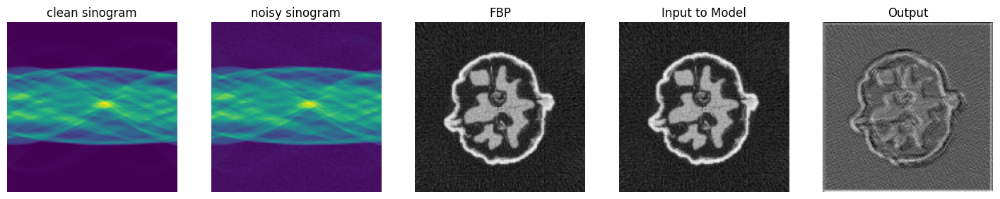

In [4]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize=(18,6))

ax1.imshow(y[0,0,:,:].cpu().numpy())
ax1.set_title("clean sinogram")
ax1.axis("off")
ax1.set_aspect(y.shape[-1] / y.shape[-2]) 

ax2.imshow(y_noise[0,0,:,:].cpu().numpy())
ax2.set_title("noisy sinogram")
ax2.axis("off")
ax2.set_aspect(y.shape[-1] / y.shape[-2]) 

ax3.imshow(x_fbp[0,0,:,:].cpu().numpy(), cmap="gray")
ax3.set_title("FBP")
ax3.axis("off")

ax4.imshow(z[0,0,:,:].cpu().numpy(), cmap="gray")
ax4.set_title("Input to Model")
ax4.axis("off")

ax5.imshow(x_pred[0,0,:,:].cpu().numpy(), cmap="gray")
ax5.set_title("Output")
ax5.axis("off")


plt.show()


In [5]:
# compute full jacobian 



theta_0 = dict(model.named_parameters())

# Example function: Replace with your model's forward pass
def model_forward(params, inputs):
    
    # Unflatten the one-hot vector to match the structure of theta_0
    params_struct = {}
    start = 0
    for key, param in theta_0.items():
        numel = param.numel()
        params_struct[key] = params[start:start + numel].view_as(param)
        start += numel

    
    return functional_call(model, params_struct, inputs)

# Example inputs
params = dict(model.named_parameters())  # Replace with your model's parameters
flat_params = torch.cat([p.flatten() for p in params.values()])
# Compute the Jacobian matrix

jacobian = jacrev(model_forward, argnums=0, chunk_size=1)(flat_params, z)



In [6]:
print("jacobian shape: ", jacobian.shape) # should be 128^2 x 9569 

# flatten the Jacobian  
jacobian_flat = jacobian.view(-1, jacobian.shape[-1])

print("jacobian flat: ", jacobian_flat.shape)

jacobian shape:  torch.Size([1, 1, 128, 128, 9569])
jacobian flat:  torch.Size([16384, 9569])


In [7]:

print("jacobian shape: ", jacobian.shape) # should be 128^2 x 9569 

# Flatten the Jacobian if needed (e.g., for images or higher-dimensional outputs)
jacobian_flat = jacobian.view(-1, jacobian.shape[-1])

# Perform SVD
U, S, Vh = torch.linalg.svd(jacobian_flat)

# U contains left singular vectors
# S contains singular values
# Vh (V^T) contains right singular vectors (transposed)
print("Singular values:", S.shape)
print("Left singular vectors (U):", U.shape)
print("Right singular vectors (V^T):", Vh.shape)

jacobian shape:  torch.Size([1, 1, 128, 128, 9569])
Singular values: torch.Size([9569])
Left singular vectors (U): torch.Size([16384, 16384])
Right singular vectors (V^T): torch.Size([9569, 9569])


In [8]:
K = jacobian_flat @ jacobian_flat.T

In [9]:
print(K.shape)

torch.Size([16384, 16384])


In [10]:
# get only some rows of the jacobian 

import torch
from torch.func import vjp, functional_call

def model_forward(theta):
    return functional_call(model, theta, z)

def get_jacobian_col(col_index):
    
    
    out, vjp_fun = vjp(model_forward, theta_0)

    v = torch.zeros_like(x).ravel()
    v[col_index] = 1.0 
    v = v.reshape(*x.shape)
    jac_col = vjp_fun(v)[0] # this should get me J.T v 

    out, jvp_out = jvp(model_forward, (theta_0,), (jac_col,)) # this should get me J J.T v
    
    return jvp_out.detach()
    


In [56]:
num_rows = 1000
rows_idx = np.random.choice(jacobian_flat.shape[0], num_rows, replace=False)
rows_idx = np.sort(rows_idx)
#print(rows_idx)

jac_approx = [] 

for row_idx in tqdm(rows_idx):
    jac_row = get_jacobian_col(row_idx)
    jac_approx.append(jac_row.ravel())    

C = torch.stack(jac_approx, dim=-1)
print("C: ", C.shape)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:07<00:00, 133.94it/s]


C:  torch.Size([16384, 1000])


In [57]:
W = C[rows_idx, :]

In [58]:
U_B, S_B, V_B = torch.linalg.svd(W)

In [59]:
S_B    


tensor([1.3420e+03, 2.1628e+01, 1.0592e+01, 6.7128e+00, 4.7239e+00, 4.0139e+00,
        2.7508e+00, 1.9380e+00, 1.5830e+00, 1.1965e+00, 1.0134e+00, 8.9549e-01,
        7.1734e-01, 6.1354e-01, 5.4609e-01, 4.8101e-01, 4.2613e-01, 4.0990e-01,
        3.9010e-01, 3.6548e-01, 3.4820e-01, 3.0387e-01, 2.9743e-01, 2.8130e-01,
        2.5968e-01, 2.3740e-01, 2.2320e-01, 2.1859e-01, 2.1195e-01, 2.0515e-01,
        1.9487e-01, 1.7822e-01, 1.7488e-01, 1.6218e-01, 1.5534e-01, 1.5012e-01,
        1.4493e-01, 1.4089e-01, 1.3317e-01, 1.2717e-01, 1.1941e-01, 1.1428e-01,
        1.0915e-01, 1.0199e-01, 1.0094e-01, 9.9754e-02, 9.5826e-02, 9.3459e-02,
        8.7331e-02, 8.4519e-02, 8.2256e-02, 7.7047e-02, 7.4681e-02, 7.0848e-02,
        6.8789e-02, 6.6986e-02, 6.5949e-02, 6.2989e-02, 5.9347e-02, 5.7707e-02,
        5.7378e-02, 5.5204e-02, 5.3060e-02, 5.1420e-02, 5.0190e-02, 4.9212e-02,
        4.8410e-02, 4.7026e-02, 4.6543e-02, 4.4684e-02, 4.3337e-02, 4.0720e-02,
        3.9446e-02, 3.8607e-02, 3.8180e-

In [60]:
Sigma_inv_sqrt = torch.diag(1.0 / torch.sqrt(S_B))

# Approximate eigenvectors of K
U_approx = C @ U_B @ Sigma_inv_sqrt  # Not yet orthonormal
#U_approx, _ = torch.linalg.qr(U_tilde)  # Orthonormalize

In [61]:
U_approx.shape

torch.Size([16384, 1000])

In [62]:
W_pinv = torch.linalg.pinv(W)


In [63]:
K_approx = C @ W_pinv @ C.T

In [66]:
torch.sum((K_approx - K)**2)

tensor(109.3485, grad_fn=<SumBackward0>)

In [49]:
# The singular vectors are only correct up to the sign (Kv = lambda v, K(-v) = - Kv = - lambda v = lambda (-v) 
# We align it here just for visualisation, in practice it does not make a difference 

def align_signs(U_approx, U_true):

    U_aligned = torch.clone(U_approx)
    for i in range(U_approx.shape[1]):
        sign = torch.sign(torch.dot(U_true[:, i], U_approx[:, i]))
        U_aligned[:, i] *= sign
    return U_aligned

U_approx = align_signs(U_approx, U)

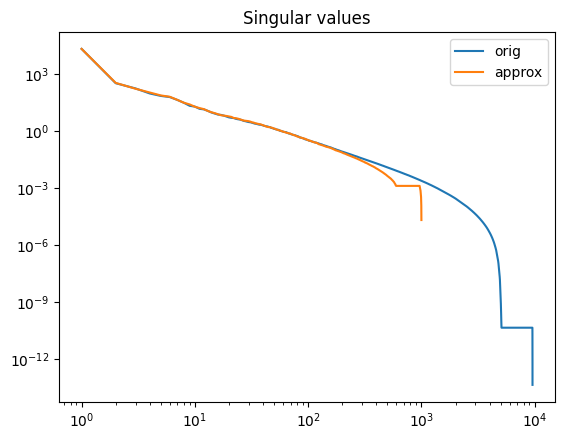

In [67]:
plt.figure()
plt.title("Singular values")
plt.loglog(np.arange(1, len(S)+1), S.detach().cpu().numpy()**2, label="orig")
plt.loglog(np.arange(1, len(S_B)+1), S_B.detach().cpu().numpy()*C.shape[0]/C.shape[1], label="approx")
plt.legend()
plt.show()

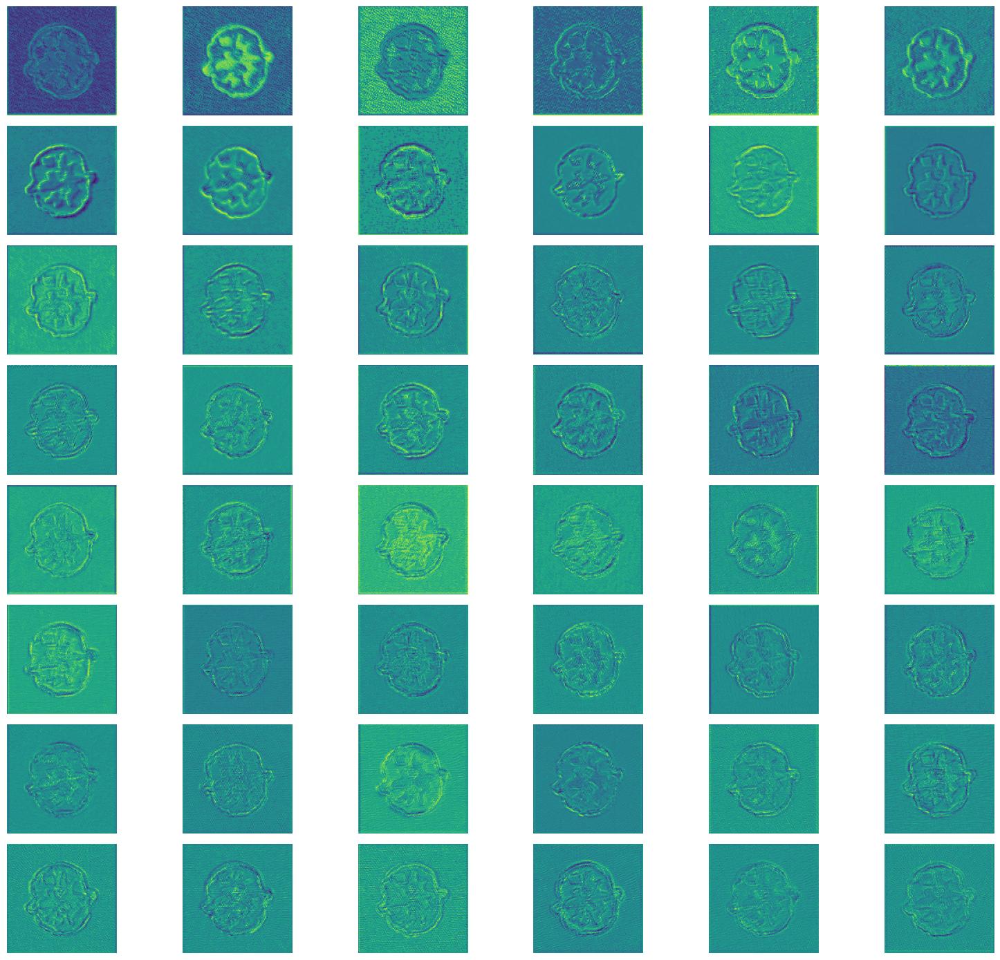

In [68]:
fig, axes = plt.subplots(8,6, figsize=(16,14))

for idx, ax in enumerate(axes.ravel()):
    if idx < U_B.shape[1]:
        ax.imshow(U_approx[:,idx].reshape(128,128).detach().cpu().numpy())
    ax.axis("off")
fig.tight_layout()
plt.show()

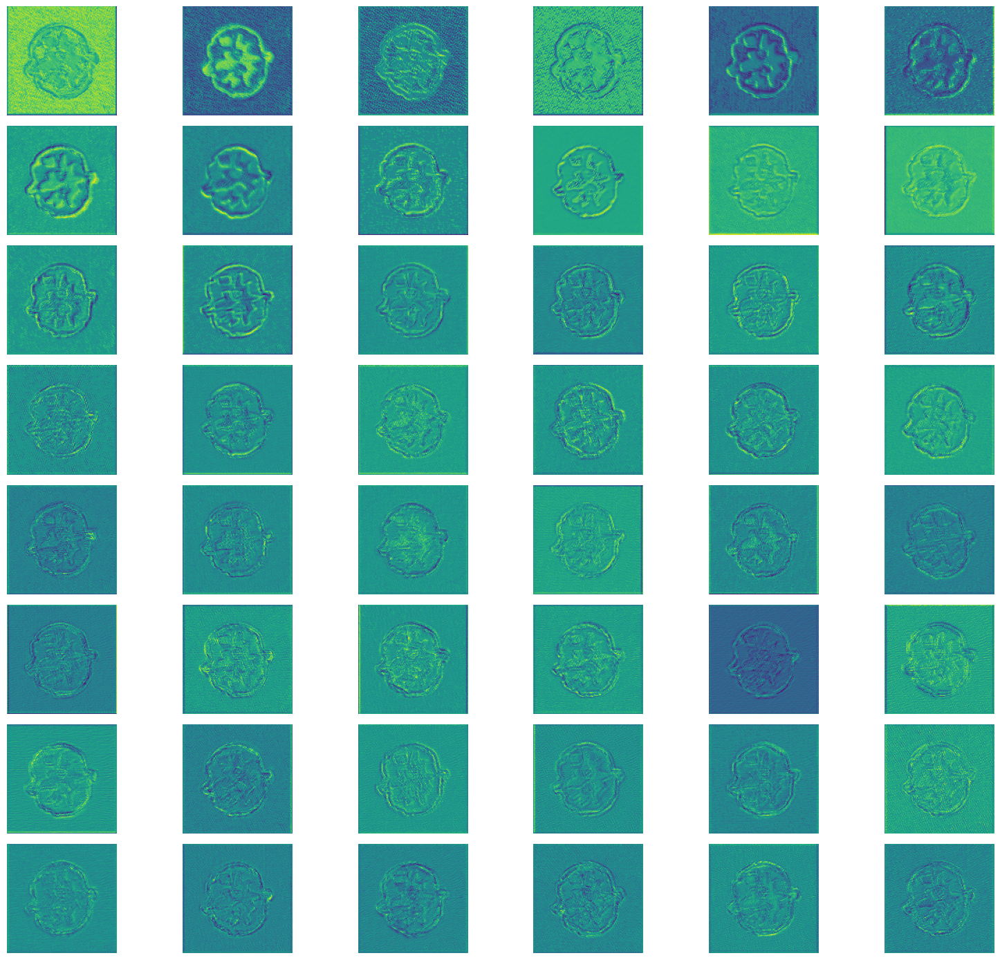

In [69]:
fig, axes = plt.subplots(8,6, figsize=(16,14))

for idx, ax in enumerate(axes.ravel()):
    ax.imshow(U[:,idx].reshape(128,128).detach().cpu().numpy())
    ax.axis("off")
fig.tight_layout()
plt.show()

In [60]:
K_approx = U_approx @ torch.diag(S_B) @ U_approx.T

In [61]:
K_approx.shape

torch.Size([16384, 16384])

In [63]:
print(torch.sum((K_approx - K)**2).item())

0.07002636045217514


In [7]:
# get only some rows of the jacobian 

import torch
from torch.func import jvp, functional_call

def model_forward(theta):
    return functional_call(model, theta, z)

def get_jacobian_row(row_index):
    
    # Flatten theta_0 to compute input dimension
    flat_params = torch.cat([p.flatten() for p in theta_0.values()])
    input_dim = flat_params.numel()  # Total number of parameters
    
    # Create a one-hot vector for the desired row
    v_flat = torch.zeros(input_dim)
    v_flat[row_index] = 1.0
    
    # Unflatten the one-hot vector to match the structure of theta_0
    v_struct = {}
    start = 0
    for key, param in theta_0.items():
        numel = param.numel()
        v_struct[key] = v_flat[start:start + numel].view_as(param)
        start += numel

    #print(theta_0)
    #print(v_struct)
    # Compute the JVP
    out, jvp_out = jvp(model_forward, (theta_0,), (v_struct,))
    
    return jvp_out.detach()


In [23]:
num_rows = 2000
rows_idx = np.random.choice(jacobian_flat.shape[-1], num_rows, replace=False)
rows_idx = np.sort(rows_idx)
#print(rows_idx)

jac_approx = [] 

for row_idx in rows_idx:
    jac_row = get_jacobian_row(rows_idx)
    jac_approx.append(jac_row.ravel())    

jac_approx = torch.stack(jac_approx, dim=-1)
print("jac approx: ", jac_approx.shape)

jac approx:  torch.Size([16384, 2000])


In [24]:
W = jac_approx.T @ jac_approx
print(W.shape)

torch.Size([2000, 2000])


In [ ]:
W_inv = torch.linalg.pinv(W + 1e-5 * torch.eye(W.shape[0], device=W.device))  # Regularized inverse
print(W_inv.shape)

In [ ]:
K_approx = jac_approx @ W_inv @ jac_approx.T
print(K_approx.shape)

In [ ]:
K = jacobian_flat @ jacobian_flat.T
print(K.shape)

In [ ]:
print(torch.mean((K - K_approx)**2))

In [25]:
U_W, S_W, Vh_W = torch.linalg.svd(W)

print(U_W.shape, S_W.shape, Vh_W.shape)


torch.Size([2000, 2000]) torch.Size([2000]) torch.Size([2000, 2000])


In [26]:
U_approx = torch.sqrt(torch.tensor(W.shape[0]/ jac_approx.shape[0]))  * jac_approx @ U_W
U_approx = U_approx/S_W

print(U_approx.shape)

torch.Size([16384, 2000])


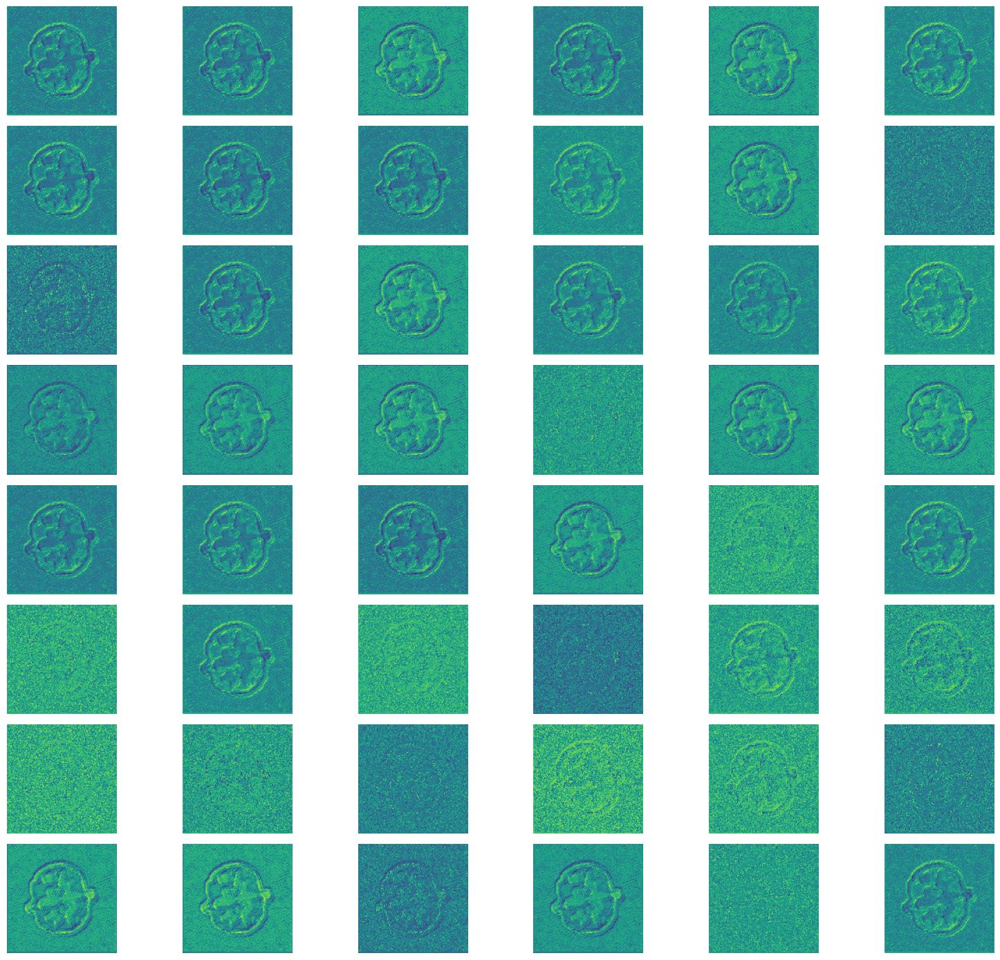

In [27]:
fig, axes = plt.subplots(8,6, figsize=(16,14))

for idx, ax in enumerate(axes.ravel()):
    ax.imshow(U_approx[:,idx].reshape(128,128).detach().cpu().numpy())
    ax.axis("off")
fig.tight_layout()
plt.show()

In [13]:

print("jacobian shape: ", jacobian.shape) # should be 128^2 x 9569 

# Flatten the Jacobian if needed (e.g., for images or higher-dimensional outputs)
jacobian_flat = jacobian.view(-1, jacobian.shape[-1])

# Perform SVD
U, S, Vh = torch.linalg.svd(jacobian_flat)

# U contains left singular vectors
# S contains singular values
# Vh (V^T) contains right singular vectors (transposed)
print("Singular values:", S.shape)
print("Left singular vectors (U):", U.shape)
print("Right singular vectors (V^T):", Vh.shape)


jacobian shape:  torch.Size([1, 1, 128, 128, 9569])
Singular values: torch.Size([9569])
Left singular vectors (U): torch.Size([16384, 16384])
Right singular vectors (V^T): torch.Size([9569, 9569])


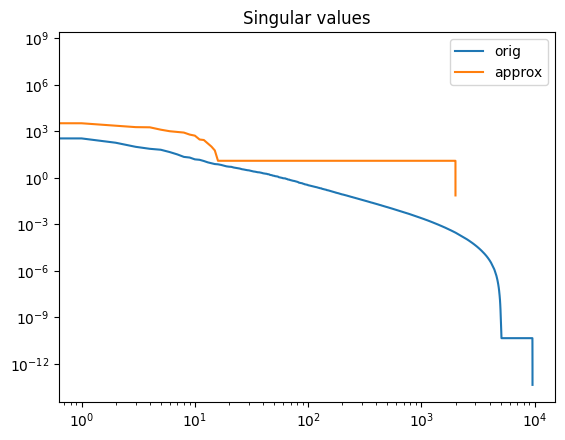

In [29]:
plt.figure()
plt.title("Singular values")
plt.loglog(S.detach().cpu().numpy()**2, label="orig")
plt.loglog(S_W.detach().cpu().numpy()*16384/num_rows, label="approx")
plt.legend()
plt.show()

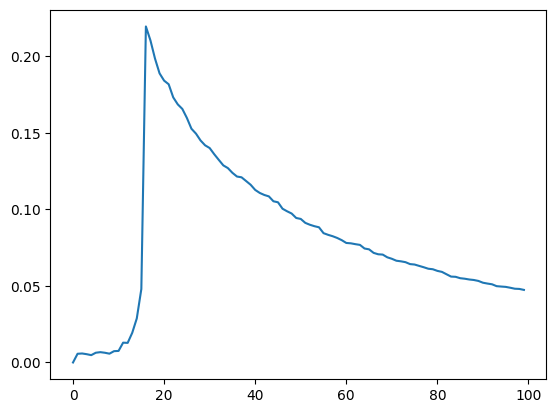

In [31]:
plt.figure()
plt.plot(S.detach().cpu().numpy()[:100] /  (S_W.detach().cpu().numpy()[:100]*16384/num_rows))
plt.show()

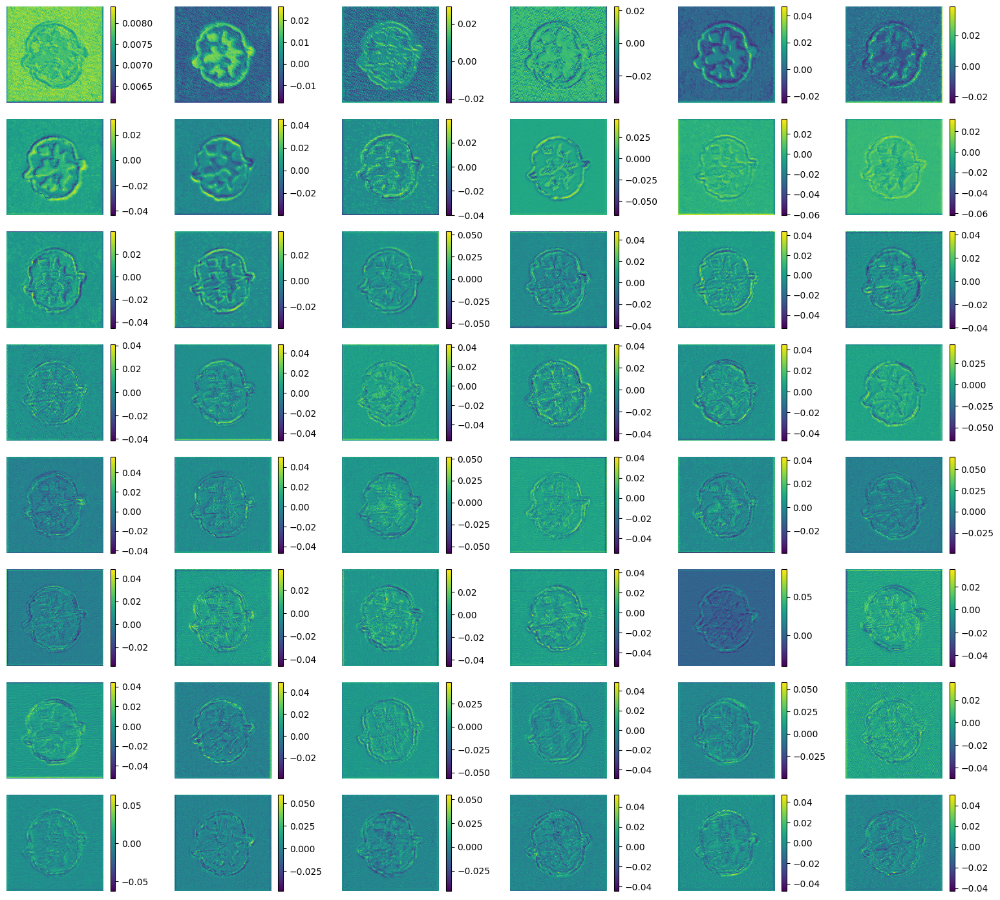

In [32]:
fig, axes = plt.subplots(8,6, figsize=(16,14))

for idx, ax in enumerate(axes.ravel()):
    im = ax.imshow(U[:,idx].reshape(128,128).detach().cpu().numpy())
    fig.colorbar(im, ax=ax)

    ax.axis("off")
fig.tight_layout()
plt.show()

In [33]:
# get only some rows of the jacobian 

import torch
from torch.func import vjp, functional_call

def model_forward(theta):
    return functional_call(model, theta, z)

def get_jacobian_col(col_index):
    
    
    out, vjp_fun = vjp(model_forward, theta_0)

    v = torch.zeros_like(x).ravel()
    v[col_index] = 1.0 
    v = v.reshape(*x.shape)
    jac_col = vjp_fun(v)[0] # this should get me J.T v 

    
    out, jvp_out = jvp(model_forward, (theta_0,), (jac_col,)) # this should get me J J.T v
    
    return jvp_out.detach()
    
jac_col = get_jacobian_col(10)
print(jac_col.shape)


torch.Size([1, 1, 128, 128])


In [34]:
num_rows = 2000
rows_idx = np.random.choice(np.prod(x.shape), num_rows, replace=False)
rows_idx = np.sort(rows_idx)

jac_approx = [] 

for row_idx in rows_idx:
    jac_row = get_jacobian_col(rows_idx)
    jac_approx.append(jac_row.ravel())    

jac_approx = torch.stack(jac_approx, dim=-1)
print("jac approx: ", jac_approx.shape)

jac approx:  torch.Size([16384, 2000])


In [35]:
#W = jac_approx.T @ jac_approx
#print(W.shape)

W = jac_approx[:jac_approx.shape[1], :]
print(W.shape)


torch.Size([2000, 2000])


In [ ]:
W_inv = torch.linalg.pinv(W + 1e-5 * torch.eye(W.shape[0], device=W.device))  # Regularized inverse
print(W_inv.shape)

In [ ]:
K_approx = jac_approx @ W_inv @ jac_approx.T
print(K_approx.shape)

In [ ]:
K = jacobian_flat @ jacobian_flat.T
print(K.shape)

In [ ]:
print(torch.mean((K - K_approx)**2))

In [36]:
U_W, S_W, Vh_W = torch.linalg.svd(W)

print(U_W.shape, S_W.shape, Vh_W.shape)


torch.Size([2000, 2000]) torch.Size([2000]) torch.Size([2000, 2000])


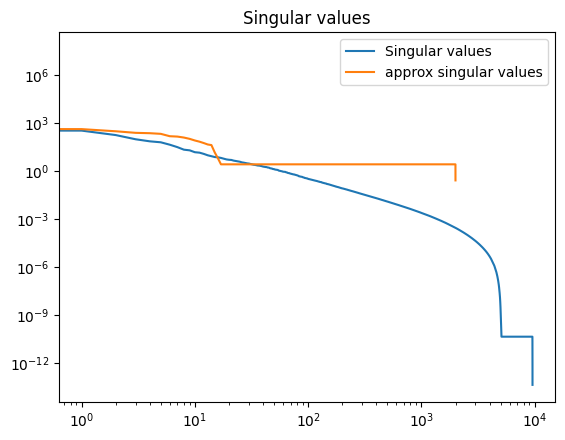

In [37]:
plt.figure()
plt.title("Singular values")
plt.loglog(S.detach().cpu().numpy()**2, label="Singular values")
plt.loglog(S_W.detach().cpu().numpy()*jac_approx.shape[0]/W.shape[0], label="approx singular values")
plt.legend()
plt.show()

In [40]:
S.detach().cpu().numpy()[0:10]**2

array([2.2054621e+04, 3.4149890e+02, 1.7989980e+02, 9.8052994e+01,
       7.2946030e+01, 6.3439800e+01, 4.4890068e+01, 3.1690819e+01,
       2.1909035e+01, 1.9893463e+01], dtype=float32)

In [41]:
S_W.detach().cpu().numpy()[0:10]*jac_approx.shape[0]/W.shape[0]

array([4.4489740e+07, 4.2399567e+02, 3.1062561e+02, 2.4787277e+02,
       2.3524240e+02, 2.1450711e+02, 1.5240341e+02, 1.4466026e+02,
       1.2567174e+02, 1.0396625e+02], dtype=float32)

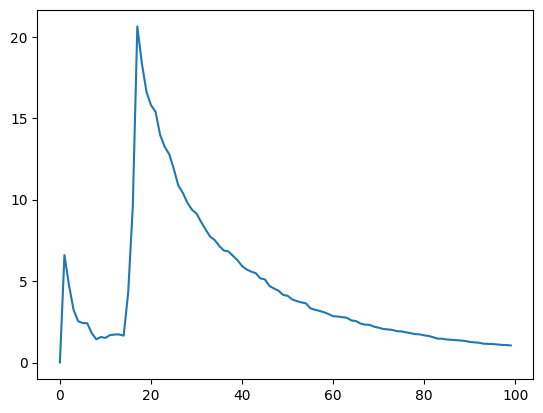

In [39]:
plt.figure()
plt.plot(S.detach().cpu().numpy()[:100]**2 /  (S_W.detach().cpu().numpy()[:100]))
plt.show()

In [42]:
U_approx = torch.sqrt(torch.tensor(W.shape[0]/ jac_approx.shape[0])) * 1/S_W[0] * jac_approx @ U_W[:,0]

print(U_approx.shape)

torch.Size([16384])


In [50]:
U_approx_full = torch.sqrt(torch.tensor(W.shape[0]/ jac_approx.shape[0])) * jac_approx @ U_W
U_approx_full = U_approx_full/S_W
print(U_approx_full.shape)

torch.Size([16384, 2000])


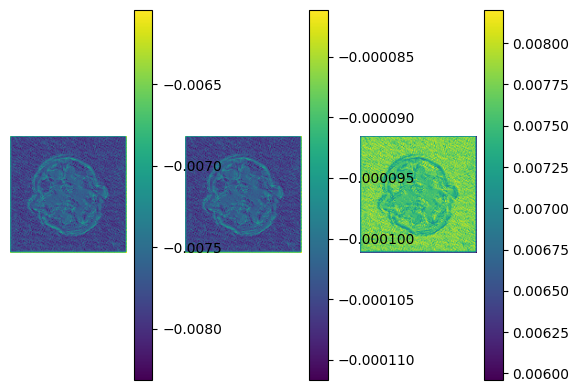

In [49]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3)

im = ax1.imshow(U_approx.reshape(128,128).detach().cpu().numpy())
fig.colorbar(im, ax=ax1)
ax1.axis("off")

im = ax2.imshow(U_approx_full[:,0].reshape(128,128).detach().cpu().numpy())
fig.colorbar(im, ax=ax2)
ax2.axis("off")

diff = np.abs(U_approx.reshape(128,128).detach().cpu().numpy() - U_approx_full[:,0].reshape(128,128).detach().cpu().numpy())
im = ax3.imshow(diff)
fig.colorbar(im, ax=ax3)
ax3.axis("off")

plt.show()

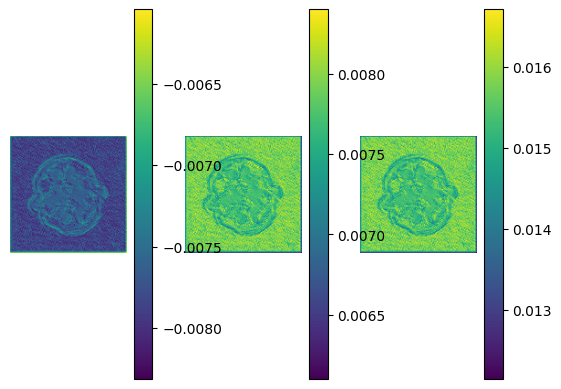

In [45]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3)

im = ax1.imshow(U_approx.reshape(128,128).detach().cpu().numpy())
fig.colorbar(im, ax=ax1)
ax1.axis("off")

im = ax2.imshow(U[:,0].reshape(128,128).detach().cpu().numpy())
fig.colorbar(im, ax=ax2)
ax2.axis("off")

diff = np.abs(U_approx.reshape(128,128).detach().cpu().numpy() - U[:,0].reshape(128,128).detach().cpu().numpy())
im = ax3.imshow(diff)
fig.colorbar(im, ax=ax3)
ax3.axis("off")

plt.show()

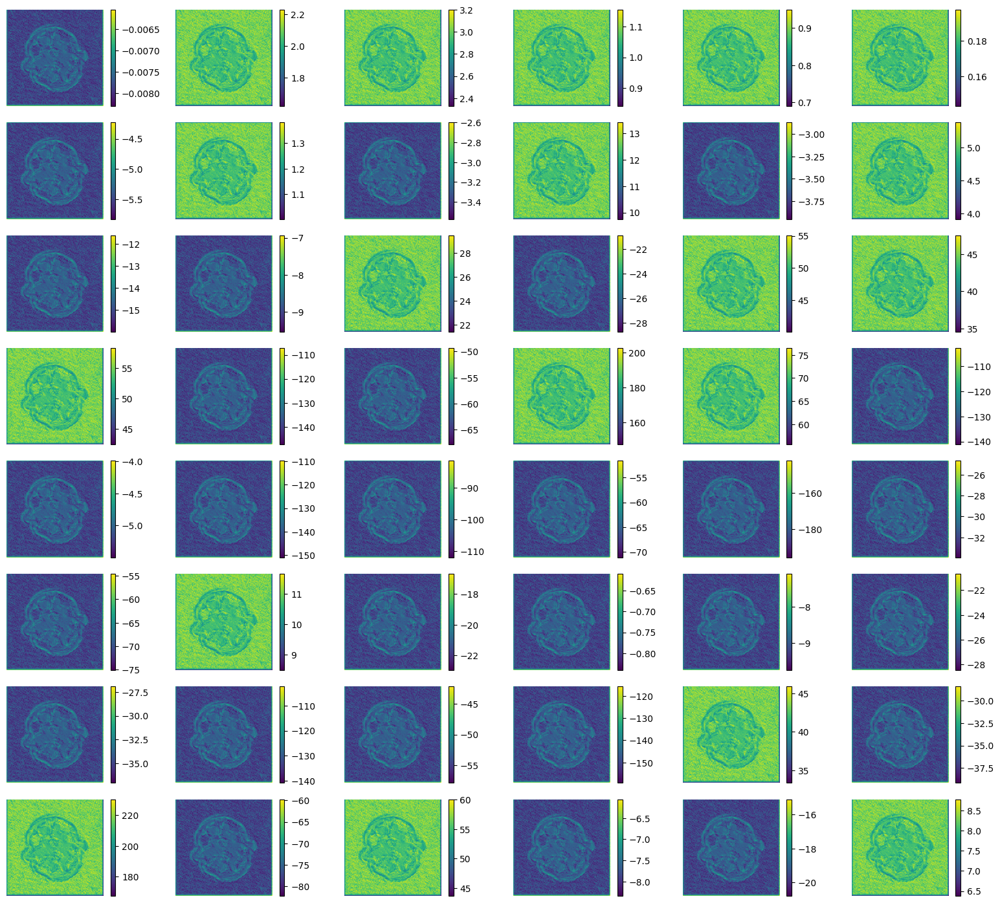

In [46]:
fig, axes = plt.subplots(8,6, figsize=(16,14))

for idx, ax in enumerate(axes.ravel()):
    im = ax.imshow(U_approx_full[:,idx].reshape(128,128).detach().cpu().numpy())
    fig.colorbar(im, ax=ax)
    ax.axis("off")
fig.tight_layout()
plt.show()

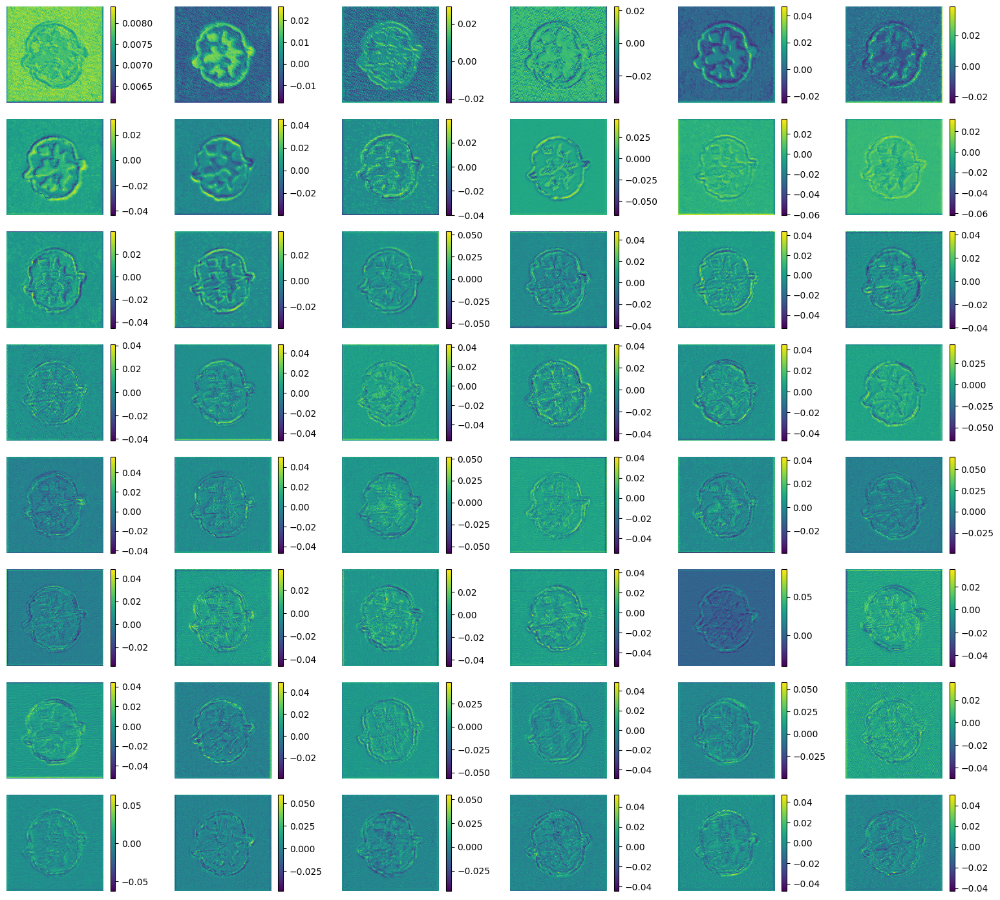

In [47]:
fig, axes = plt.subplots(8,6, figsize=(16,14))

for idx, ax in enumerate(axes.ravel()):
    im = ax.imshow(U[:,idx].reshape(128,128).detach().cpu().numpy())
    fig.colorbar(im, ax=ax)

    ax.axis("off")
fig.tight_layout()
plt.show()

In [ ]:
jacobian_flat.shape

In [ ]:
first_singular_value = S[0]
first_left_vector = U[:, 0]
first_right_vector = Vh[0, :]

# Compute the action of J on the first right singular vector
J_dot_v1 = jacobian_flat @ first_right_vector

# Verify that it is equal to the first singular value times the first left singular vector
test_result = torch.sum((J_dot_v1 - first_singular_value * first_left_vector)**2)

print("First singular value:", first_singular_value)
print("Verification successful:", test_result)

In [ ]:
first_singular_value = S[0]
first_left_vector = U[:, 0]
first_right_vector = Vh[0, :]

# Compute the action of J on the first right singular vector
JT_dot_u1 = jacobian_flat.T @ first_left_vector

# Verify that it is equal to the first singular value times the first left singular vector
test_result = torch.sum((JT_dot_u1 - first_singular_value * first_right_vector)**2)

print("First singular value:", first_singular_value)
print("Verification successful:", test_result)

In [ ]:
# can we represent x using the (left) singular vectors? 

rel_errors = []

x_svd = 0 
for i in range(U.shape[1]):
    x_svd += torch.dot(x.ravel(), U[:,i]) * U[:,i]

    rel_errors.append((torch.sum((x.ravel() - x_svd)**2)/torch.sum(x**2)).item())
    #plt.figure()
    #plt.title(f"Using {i+1} singular vectors")
    #plt.imshow(x_svd.reshape(128,128).detach().cpu().numpy(), cmap="gray")
    #plt.colorbar()
    #plt.axis("off")
    #plt.show()

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))

fig.suptitle("Reconstruction Error using singular vectors")
ax1.loglog(rel_errors)
ax1.set_xlabel("#singular vectors")
ax1.set_ylabel("relative error |x-x_svd|^2/|x|^2")

im = ax2.imshow(x_svd.reshape(128,128).detach().cpu().numpy(), cmap="gray")
fig.colorbar(im, ax=ax2)
ax2.axis("off")

im = ax3.imshow(x[0,0].detach().cpu().numpy(), cmap="gray")
fig.colorbar(im, ax=ax3)
ax3.axis("off")

plt.show()